In [107]:
from tensorflow import keras
from tensorflow.keras import layers
import cv2
import os
import PIL
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, Activation, Conv2D, MaxPooling2D,BatchNormalization
from tensorflow.keras import optimizers
from keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications. vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
import zipfile
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import pandas as pd
from os import listdir
import random
import scipy
import pylab as pl
from PIL import Image
import warnings 
warnings.filterwarnings("ignore")

In [16]:
import pathlib

In [59]:
# Directory with Saree pictures
saree_df = os.path.join(r'C:\Users\shaha\Sarees_Images')

In [64]:
# Directory with Trouser pictures
Jeans_df = os.path.join(r'C:\Users\shaha\Jeans_Images')

In [65]:
# Directory with jenas pictures
Trouser_dir = os.path.join(r'C:\Users\shaha\Trousers_Images')

In [66]:
train_saree_names = os.listdir(saree_df)
print(train_saree_names[:10])

['img1.jpeg', 'img10.jpeg', 'img100.jpeg', 'img101.jpeg', 'img102.jpeg', 'img103.jpeg', 'img104.jpeg', 'img105.jpeg', 'img106.jpeg', 'img107.jpeg']


In [67]:
train_trousers_names = os.listdir(trousers_df)
print(train_trousers_names[:10])

['img1.jpeg', 'img10.jpeg', 'img100.jpeg', 'img101.jpeg', 'img102.jpeg', 'img103.jpeg', 'img104.jpeg', 'img105.jpeg', 'img106.jpeg', 'img107.jpeg']


In [68]:
train_jeans_names = os.listdir(Jeans_df)
print(train_jeans_names[:10])

['img1.jpeg', 'img10.jpeg', 'img100.jpeg', 'img101.jpeg', 'img102.jpeg', 'img103.jpeg', 'img104.jpeg', 'img105.jpeg', 'img106.jpeg', 'img107.jpeg']


# Displaying Images:

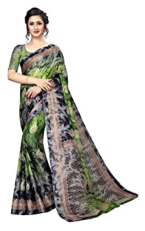

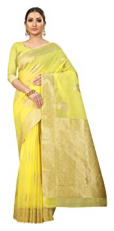

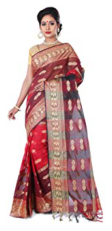

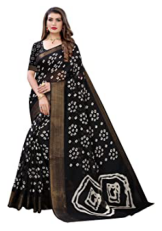

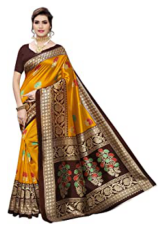

...

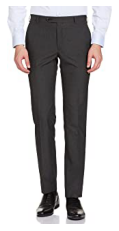

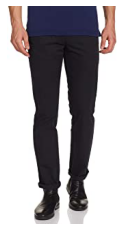

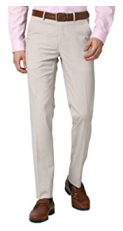

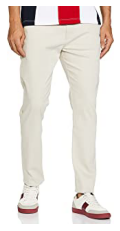

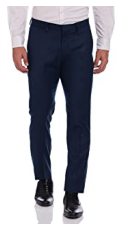

In [74]:
Cloth_train=[saree_df, Jeans_df, Trouser_dir]
for dirs in Cloth_train:
    k=listdir(dirs)
    for i in k[:10]:
        img=mpimg.imread('{}/{}'.format(dirs,i))
        plt.imshow(img)
        plt.axis('off')
        plt.show()

In [73]:
print("Count of Training Images")
print("No.of Images of Sarees in train dataset :",len(os.listdir(r'C:\Users\shaha\Sarees_Images')))
print("No.of Images of Jeans in train dataset :",len(os.listdir(r'C:\Users\shaha\Jeans_Images')))
print("No.of Images of Trousers in train dataset :",len(os.listdir(r'C:\Users\shaha\Trousers_Images')))

Count of Training Images
No.of Images of Sarees in train dataset : 400
No.of Images of Jeans in train dataset : 400
No.of Images of Trousers in train dataset : 400


In [77]:
print("Count of Test Images")
print("No.of Images of Sarees in Test dataset :",len(os.listdir(r'C:\Users\shaha\Test sareer images')))
print("No.of Images of Jeans in Test dataset :",len(os.listdir(r'C:\Users\shaha\Test Jeans images')))
print("No.of Images of Trousers in Test dataset :",len(os.listdir(r'C:\Users\shaha\test trouser images')))

Count of Test Images
No.of Images of Sarees in Test dataset : 72
No.of Images of Jeans in Test dataset : 72
No.of Images of Trousers in Test dataset : 72


# Model Building:

In [81]:
train_data=r'C:\Users\shaha\Train images'
test_data=r'C:\Users\shaha\Test images'

In [82]:
#Defining dimensions of images and other parameters
input_shape = (128,128,3)
img_width = 128
img_height = 128
batch_size = 12
epoch = 100
train_samples = 400
test_samples = 72

In [83]:
# Data Augmentation on Training Images

Train_datagen=ImageDataGenerator(rescale=1./255,
                                             zoom_range=0.2,
                                             rotation_range=30,
                                             horizontal_flip=True)
Training_set=Train_datagen.flow_from_directory(train_data,
                                                              target_size=(img_width,img_height),
                                                              batch_size=batch_size, 
                                                              class_mode='categorical')

Found 1200 images belonging to 3 classes.


In [84]:
# Test Data Generator
Test_datagen=ImageDataGenerator(rescale=1./255)
Test_set=Test_datagen.flow_from_directory(test_data,
                                                  target_size=(img_width,img_height),
                                                  batch_size=batch_size, 
                                                  class_mode='categorical')

Found 216 images belonging to 3 classes.


In [87]:
model=Sequential()
# First convolution layer
model.add(Conv2D(32,(3,3),input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

In [88]:
# Second convolution layer
model.add(Conv2D(32,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

In [89]:
# Third convolution layer
model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

In [90]:
# Fourth convolution layer
model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

In [91]:
model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(3))
model.add(Activation('softmax'))

In [92]:
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 activation (Activation)     (None, 126, 126, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 63, 63, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        9248      
                                                                 
 activation_1 (Activation)   (None, 61, 61, 32)        0         
                                                      

In [93]:
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [94]:
# Defining Early stopping and Model check point
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint

In [95]:
ES = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=30)
MC = ModelCheckpoint('best.A5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

In [96]:
# Fitting the Training Data
history = model.fit(
    Training_set, 
    epochs=epoch,
    validation_data=Test_set,
    validation_steps=test_samples//batch_size,
    steps_per_epoch=train_samples//batch_size,
    callbacks=[ES,MC])

Epoch 1/100
33/33 [==============================] - ETA: 0s - loss: 1.0318 - accuracy: 0.4571
Epoch 1: val_accuracy improved from -inf to 0.66667, saving model to best.h5
33/33 [==============================] - 6s 161ms/step - loss: 1.0318 - accuracy: 0.4571 - val_loss: 0.8108 - val_accuracy: 0.6667
Epoch 2/100
33/33 [==============================] - ETA: 0s - loss: 0.6874 - accuracy: 0.6162
Epoch 2: val_accuracy did not improve from 0.66667
33/33 [==============================] - 5s 151ms/step - loss: 0.6874 - accuracy: 0.6162 - val_loss: 0.6155 - val_accuracy: 0.5972
Epoch 3/100
33/33 [==============================] - ETA: 0s - loss: 0.6231 - accuracy: 0.6515
Epoch 3: val_accuracy did not improve from 0.66667
33/33 [==============================] - 6s 167ms/step - loss: 0.6231 - accuracy: 0.6515 - val_loss: 0.5595 - val_accuracy: 0.6667
Epoch 4/100
33/33 [==============================] - ETA: 0s - loss: 0.5869 - accuracy: 0.6566
Epoch 4: val_accuracy did not improve from 0.666

In [97]:
#Saving the best model
model.save('bestmodel.A5')

INFO:tensorflow:Assets written to: bestmodel.A5\assets


In [98]:
hist = pd.DataFrame(model.history.history)

In [99]:
hist

,loss,accuracy,val_loss,val_accuracy
0,1.031760,0.457071,0.810826,0.666667
1,0.687384,0.616162,0.615525,0.597222
2,0.623110,0.651515,0.559460,0.666667
3,0.586924,0.656566,0.719192,0.625000
4,0.573211,0.666667,0.886042,0.750000
...,...,...,...,...
95,0.292093,0.876263,0.158949,0.930556
96,0.271044,0.878788,0.133891,0.930556
97,0.228836,0.914141,0.110914,0.916667
98,0.280390,0.883838,0.215043,0.902778


# Loading the saved model

In [100]:
saved_model = load_model('bestmodel.A5')

In [101]:
#creating instances where elements from test directory will be called
test_jeans = r'C:\Users\shaha\Test images\Test Jeans images'
test_saree = r'C:\Users\shaha\Test images\Test sareer images'
test_trouser = r'C:\Users\shaha\Test images\test trouser images'

# Prediction of Test dataset

Input Image is: img1.jpeg


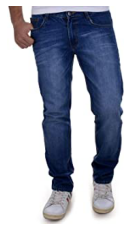

Predicted Label is: [0] 

Input Image is: img10.jpeg


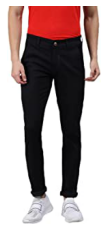

Predicted Label is: [0] 

Input Image is: img11.jpeg


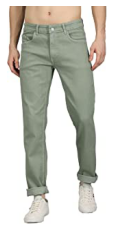

Predicted Label is: [0] 

Input Image is: img12.jpeg


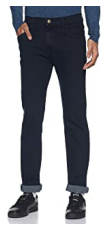

Predicted Label is: [2] 

Input Image is: img13.jpeg


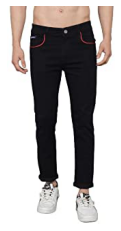

Predicted Label is: [0] 

Input Image is: img14.jpeg


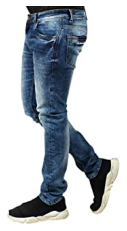

Predicted Label is: [1] 

Input Image is: img15.jpeg


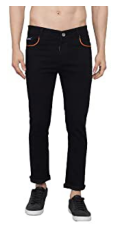

Predicted Label is: [0] 

Input Image is: img16.jpeg


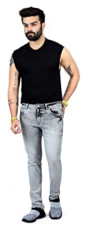

Predicted Label is: [1] 

Input Image is: img17.jpeg


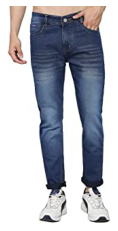

Predicted Label is: [0] 

Input Image is: img18.jpeg


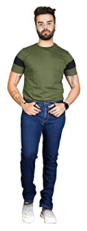

Predicted Label is: [2] 

Input Image is: img19.jpeg


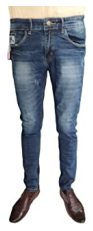

Predicted Label is: [2] 

Input Image is: img2.jpeg


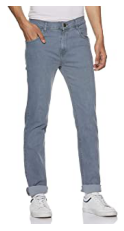

Predicted Label is: [0] 

Input Image is: img20.jpeg


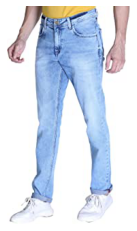

Predicted Label is: [0] 

Input Image is: img21.jpeg


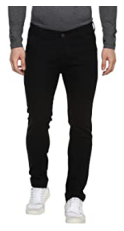

Predicted Label is: [2] 

Input Image is: img22.jpeg


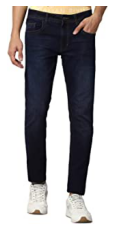

Predicted Label is: [0] 

Input Image is: img23.jpeg


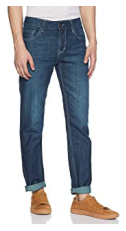

Predicted Label is: [0] 

Input Image is: img24.jpeg


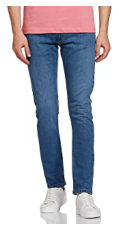

Predicted Label is: [0] 

Input Image is: img25.jpeg


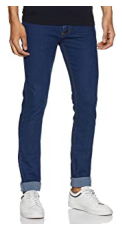

Predicted Label is: [0] 

Input Image is: img26.jpeg


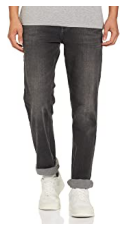

Predicted Label is: [0] 

Input Image is: img27.jpeg


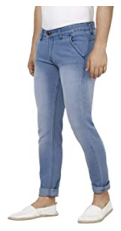

Predicted Label is: [0] 

Input Image is: img28.jpeg


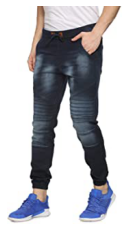

Predicted Label is: [2] 

Input Image is: img29.jpeg


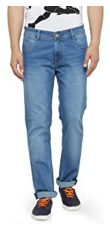

Predicted Label is: [0] 

Input Image is: img3.jpeg


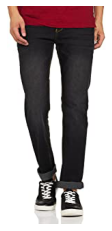

Predicted Label is: [0] 

Input Image is: img30.jpeg


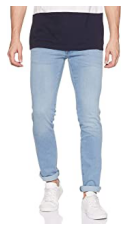

Predicted Label is: [0] 

Input Image is: img31.jpeg


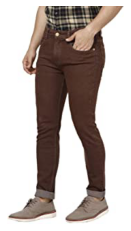

Predicted Label is: [2] 

Input Image is: img32.jpeg


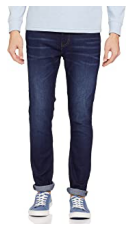

Predicted Label is: [0] 

Input Image is: img33.jpeg


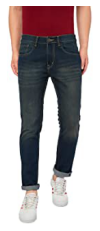

Predicted Label is: [0] 

Input Image is: img34.jpeg


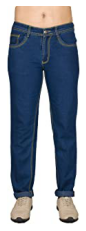

Predicted Label is: [2] 

Input Image is: img35.jpeg


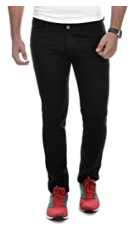

Predicted Label is: [0] 

Input Image is: img36.jpeg


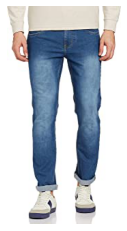

Predicted Label is: [0] 

Input Image is: img37.jpeg


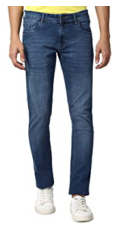

Predicted Label is: [0] 

Input Image is: img38.jpeg


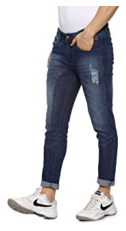

Predicted Label is: [0] 

Input Image is: img39.jpeg


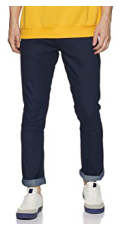

Predicted Label is: [0] 

Input Image is: img4.jpeg


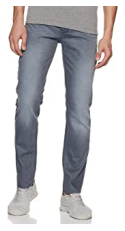

Predicted Label is: [0] 

Input Image is: img40.jpeg


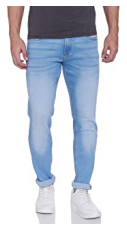

Predicted Label is: [0] 

Input Image is: img41.jpeg


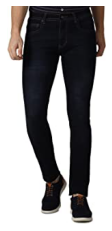

Predicted Label is: [0] 

Input Image is: img42.jpeg


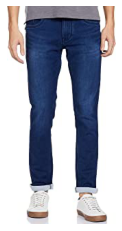

Predicted Label is: [0] 

Input Image is: img43.jpeg


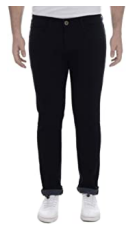

Predicted Label is: [0] 

Input Image is: img44.jpeg


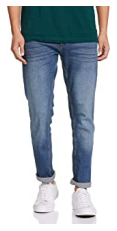

Predicted Label is: [0] 

Input Image is: img45.jpeg


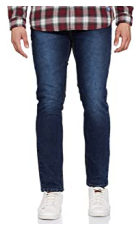

Predicted Label is: [0] 

Input Image is: img46.jpeg


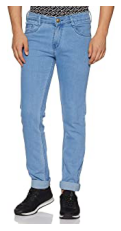

Predicted Label is: [0] 

Input Image is: img47.jpeg


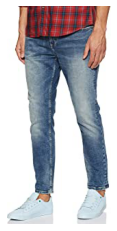

Predicted Label is: [0] 

Input Image is: img48.jpeg


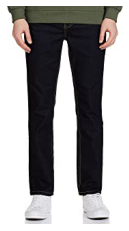

Predicted Label is: [0] 

Input Image is: img49.jpeg


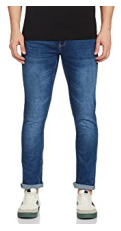

Predicted Label is: [0] 

Input Image is: img5.jpeg


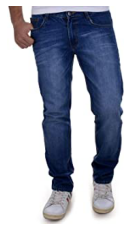

Predicted Label is: [0] 

Input Image is: img50.jpeg


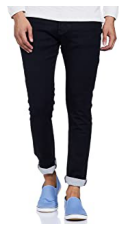

Predicted Label is: [0] 

Input Image is: img51.jpeg


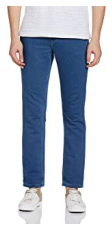

Predicted Label is: [0] 

Input Image is: img52.jpeg


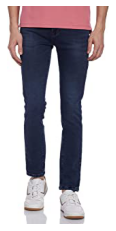

Predicted Label is: [0] 

Input Image is: img53.jpeg


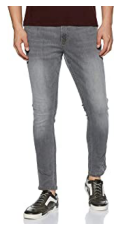

Predicted Label is: [0] 

Input Image is: img54.jpeg


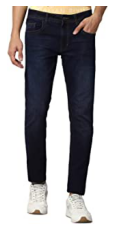

Predicted Label is: [0] 

Input Image is: img55.jpeg


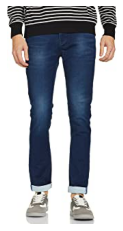

Predicted Label is: [0] 

Input Image is: img56.jpeg


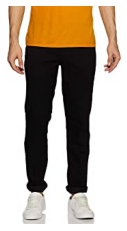

Predicted Label is: [0] 

Input Image is: img57.jpeg


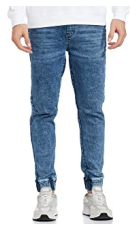

Predicted Label is: [0] 

Input Image is: img58.jpeg


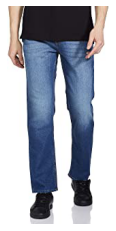

Predicted Label is: [2] 

Input Image is: img59.jpeg


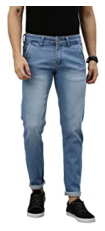

Predicted Label is: [2] 

Input Image is: img6.jpeg


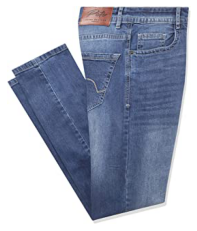

Predicted Label is: [1] 

Input Image is: img60.jpeg


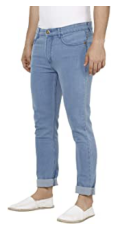

Predicted Label is: [0] 

Input Image is: img61.jpeg


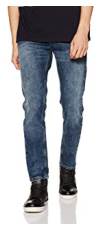

Predicted Label is: [0] 

Input Image is: img62.jpeg


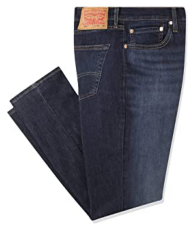

Predicted Label is: [1] 

Input Image is: img63.jpeg


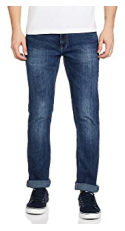

Predicted Label is: [0] 

Input Image is: img64.jpeg


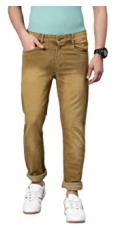

Predicted Label is: [2] 

Input Image is: img65.jpeg


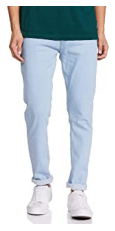

Predicted Label is: [0] 

Input Image is: img66.jpeg


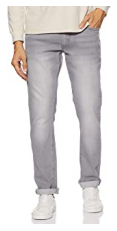

Predicted Label is: [1] 

Input Image is: img67.jpeg


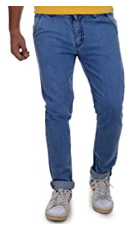

Predicted Label is: [0] 

Input Image is: img68.jpeg


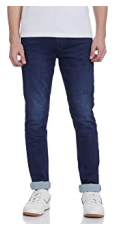

Predicted Label is: [0] 

Input Image is: img69.jpeg


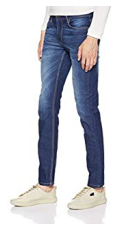

Predicted Label is: [0] 

Input Image is: img7.jpeg


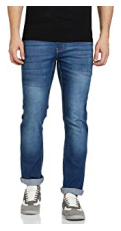

Predicted Label is: [0] 

Input Image is: img70.jpeg


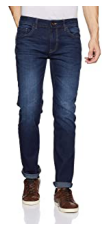

Predicted Label is: [0] 

Input Image is: img71.jpeg


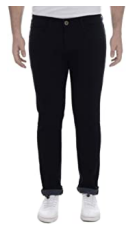

Predicted Label is: [0] 

Input Image is: img72.jpeg


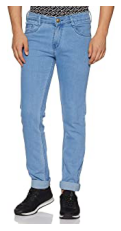

Predicted Label is: [0] 

Input Image is: img8.jpeg


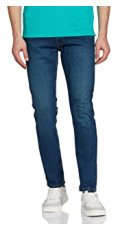

Predicted Label is: [0] 

Input Image is: img9.jpeg


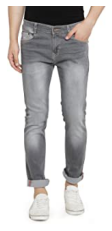

Predicted Label is: [0] 

Input Image is: img1.jpeg


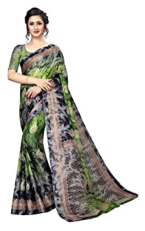

Predicted Label is: [1] 

Input Image is: img10.jpeg


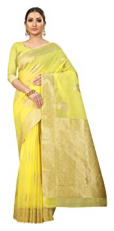

Predicted Label is: [1] 

Input Image is: img11.jpeg


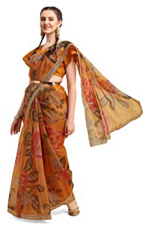

Predicted Label is: [1] 

Input Image is: img12.jpeg


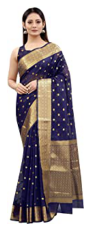

Predicted Label is: [1] 

Input Image is: img13.jpeg


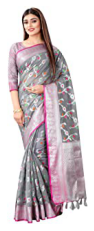

Predicted Label is: [1] 

Input Image is: img14.jpeg


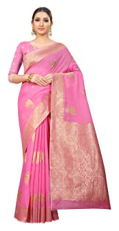

Predicted Label is: [1] 

Input Image is: img15.jpeg


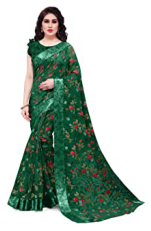

Predicted Label is: [1] 

Input Image is: img16.jpeg


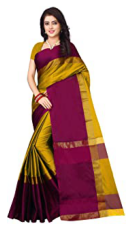

Predicted Label is: [1] 

Input Image is: img17.jpeg


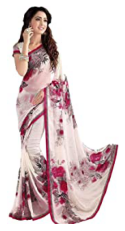

Predicted Label is: [1] 

Input Image is: img18.jpeg


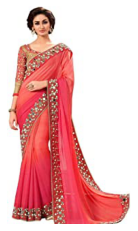

Predicted Label is: [1] 

Input Image is: img19.jpeg


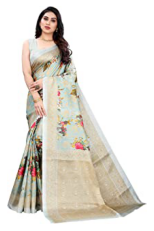

Predicted Label is: [1] 

Input Image is: img2.jpeg


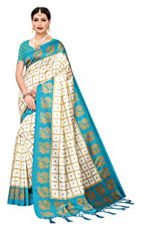

Predicted Label is: [1] 

Input Image is: img20.jpeg


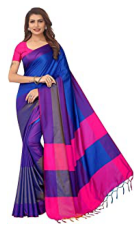

Predicted Label is: [1] 

Input Image is: img21.jpeg


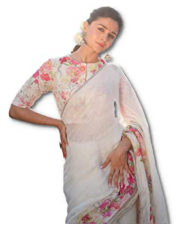

Predicted Label is: [1] 

Input Image is: img22.jpeg


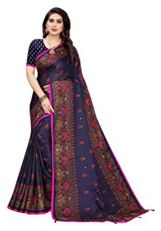

Predicted Label is: [1] 

Input Image is: img23.jpeg


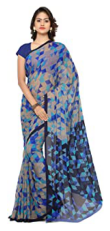

Predicted Label is: [1] 

Input Image is: img24.jpeg


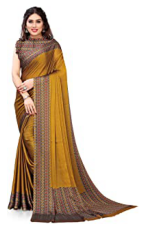

Predicted Label is: [1] 

Input Image is: img25.jpeg


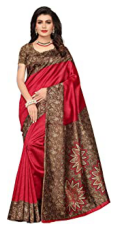

Predicted Label is: [1] 

Input Image is: img26.jpeg


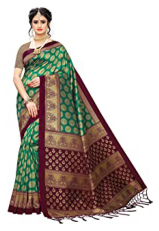

Predicted Label is: [1] 

Input Image is: img27.jpeg


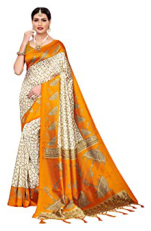

Predicted Label is: [1] 

Input Image is: img28.jpeg


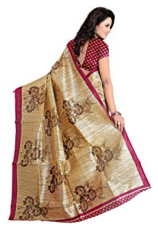

Predicted Label is: [1] 

Input Image is: img29.jpeg


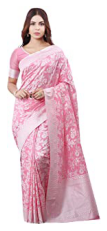

Predicted Label is: [1] 

Input Image is: img3.jpeg


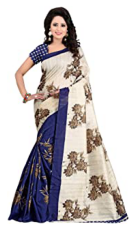

Predicted Label is: [1] 

Input Image is: img30.jpeg


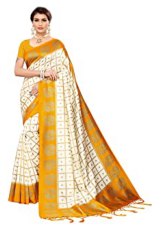

Predicted Label is: [1] 

Input Image is: img31.jpeg


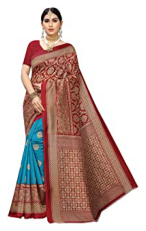

Predicted Label is: [1] 

Input Image is: img32.jpeg


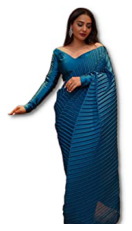

Predicted Label is: [1] 

Input Image is: img33.jpeg


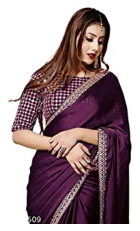

Predicted Label is: [1] 

Input Image is: img34.jpeg


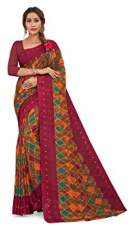

Predicted Label is: [1] 

Input Image is: img35.jpeg


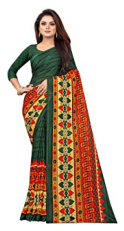

Predicted Label is: [1] 

Input Image is: img36.jpeg


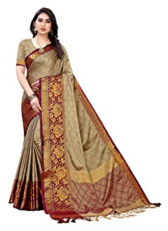

Predicted Label is: [1] 

Input Image is: img37.jpeg


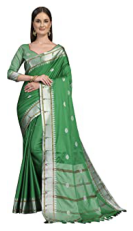

Predicted Label is: [1] 

Input Image is: img38.jpeg


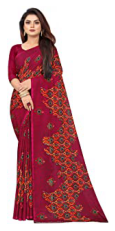

Predicted Label is: [1] 

Input Image is: img39.jpeg


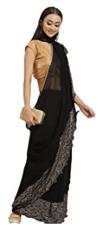

Predicted Label is: [1] 

Input Image is: img4.jpeg


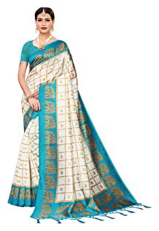

Predicted Label is: [1] 

Input Image is: img40.jpeg


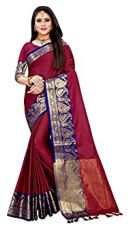

Predicted Label is: [1] 

Input Image is: img41.jpeg


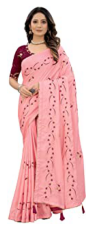

Predicted Label is: [1] 

Input Image is: img42.jpeg


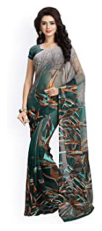

Predicted Label is: [1] 

Input Image is: img43.jpeg


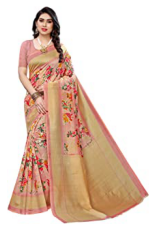

Predicted Label is: [1] 

Input Image is: img44.jpeg


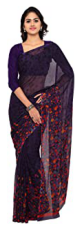

Predicted Label is: [1] 

Input Image is: img45.jpeg


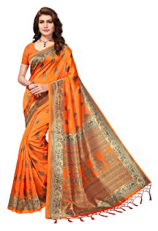

Predicted Label is: [1] 

Input Image is: img46.jpeg


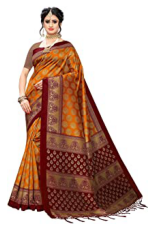

Predicted Label is: [1] 

Input Image is: img47.jpeg


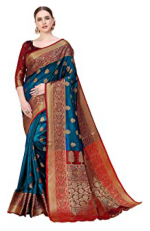

Predicted Label is: [1] 

Input Image is: img48.jpeg


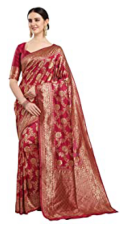

Predicted Label is: [1] 

Input Image is: img49.jpeg


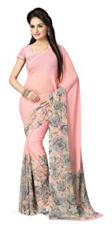

Predicted Label is: [1] 

Input Image is: img5.jpeg


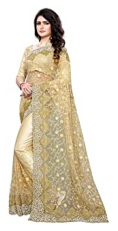

Predicted Label is: [1] 

Input Image is: img50.jpeg


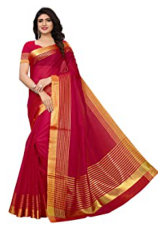

Predicted Label is: [1] 

Input Image is: img51.jpeg


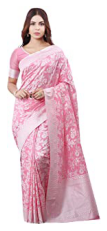

Predicted Label is: [1] 

Input Image is: img52.jpeg


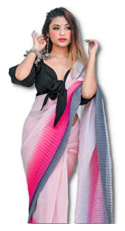

Predicted Label is: [1] 

Input Image is: img53.jpeg


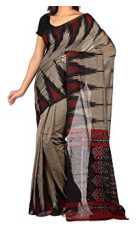

Predicted Label is: [1] 

Input Image is: img54.jpeg


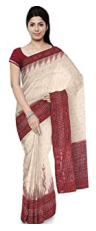

Predicted Label is: [1] 

Input Image is: img55.jpeg


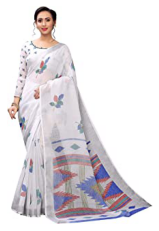

Predicted Label is: [1] 

Input Image is: img56.jpeg


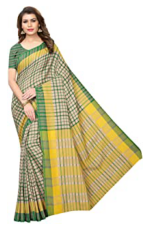

Predicted Label is: [1] 

Input Image is: img57.jpeg


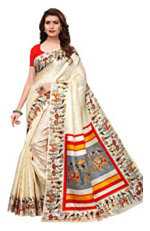

Predicted Label is: [1] 

Input Image is: img58.jpeg


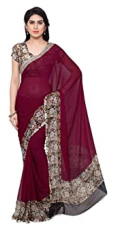

Predicted Label is: [1] 

Input Image is: img59.jpeg


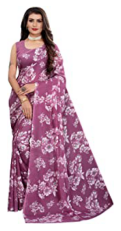

Predicted Label is: [1] 

Input Image is: img6.jpeg


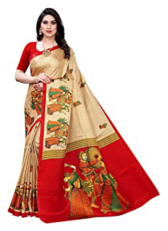

Predicted Label is: [1] 

Input Image is: img60.jpeg


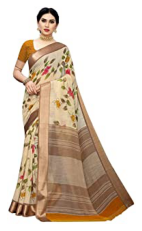

Predicted Label is: [1] 

Input Image is: img61.jpeg


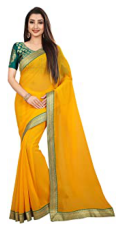

Predicted Label is: [1] 

Input Image is: img62.jpeg


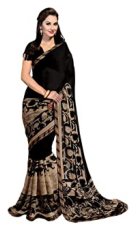

Predicted Label is: [1] 

Input Image is: img63.jpeg


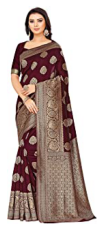

Predicted Label is: [1] 

Input Image is: img64.jpeg


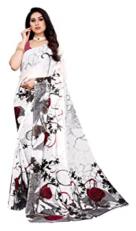

Predicted Label is: [1] 

Input Image is: img65.jpeg


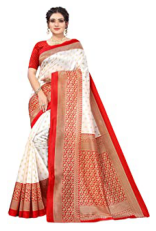

Predicted Label is: [1] 

Input Image is: img66.jpeg


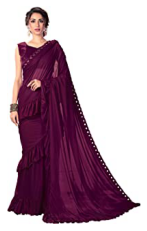

Predicted Label is: [1] 

Input Image is: img67.jpeg


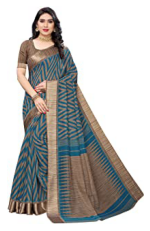

Predicted Label is: [1] 

Input Image is: img68.jpeg


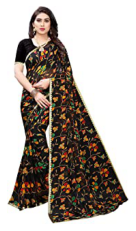

Predicted Label is: [1] 

Input Image is: img69.jpeg


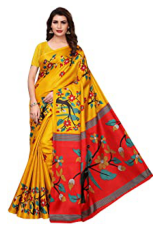

Predicted Label is: [1] 

Input Image is: img7.jpeg


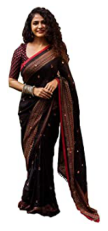

Predicted Label is: [1] 

Input Image is: img70.jpeg


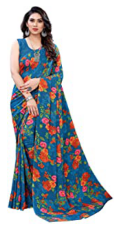

Predicted Label is: [1] 

Input Image is: img71.jpeg


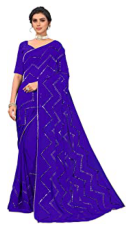

Predicted Label is: [1] 

Input Image is: img72.jpeg


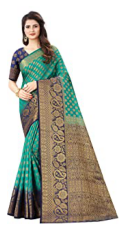

Predicted Label is: [1] 

Input Image is: img8.jpeg


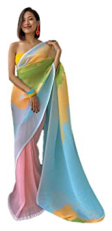

Predicted Label is: [1] 

Input Image is: img9.jpeg


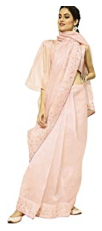

Predicted Label is: [1] 

Input Image is: img1.jpeg


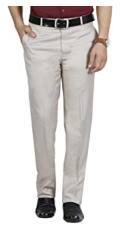

Predicted Label is: [0] 

Input Image is: img10.jpeg


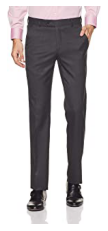

Predicted Label is: [2] 

Input Image is: img11.jpeg


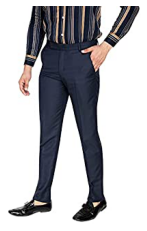

Predicted Label is: [2] 

Input Image is: img12.jpeg


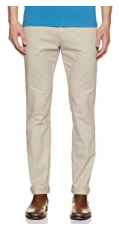

Predicted Label is: [0] 

Input Image is: img13.jpeg


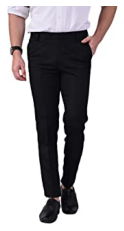

Predicted Label is: [2] 

Input Image is: img14.jpeg


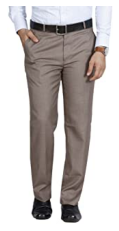

Predicted Label is: [2] 

Input Image is: img15.jpeg


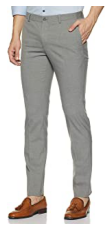

Predicted Label is: [0] 

Input Image is: img16.jpeg


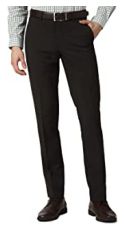

Predicted Label is: [2] 

Input Image is: img17.jpeg


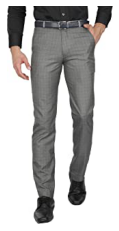

Predicted Label is: [0] 

Input Image is: img18.jpeg


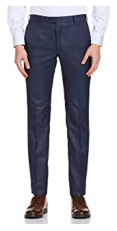

Predicted Label is: [2] 

Input Image is: img19.jpeg


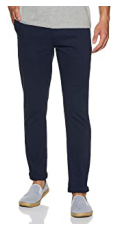

Predicted Label is: [0] 

Input Image is: img2.jpeg


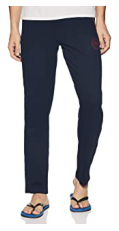

Predicted Label is: [0] 

Input Image is: img20.jpeg


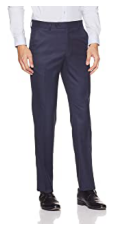

Predicted Label is: [2] 

Input Image is: img21.jpeg


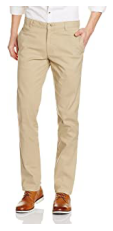

Predicted Label is: [1] 

Input Image is: img22.jpeg


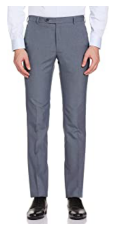

Predicted Label is: [2] 

Input Image is: img23.jpeg


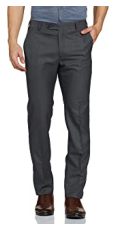

Predicted Label is: [2] 

Input Image is: img24.jpeg


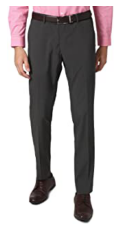

Predicted Label is: [2] 

Input Image is: img25.jpeg


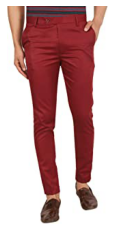

Predicted Label is: [2] 

Input Image is: img26.jpeg


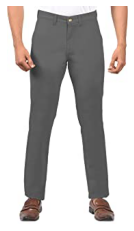

Predicted Label is: [2] 

Input Image is: img27.jpeg


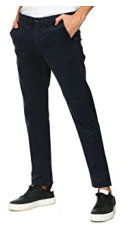

Predicted Label is: [2] 

Input Image is: img28.jpeg


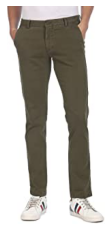

Predicted Label is: [2] 

Input Image is: img29.jpeg


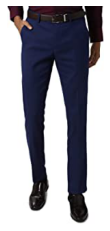

Predicted Label is: [0] 

Input Image is: img3.jpeg


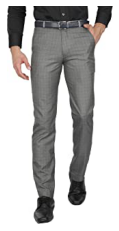

Predicted Label is: [0] 

Input Image is: img30.jpeg


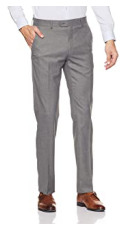

Predicted Label is: [0] 

Input Image is: img31.jpeg


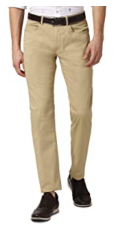

Predicted Label is: [2] 

Input Image is: img32.jpeg


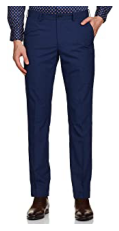

Predicted Label is: [2] 

Input Image is: img33.jpeg


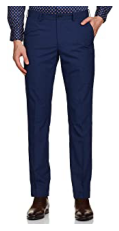

Predicted Label is: [2] 

Input Image is: img34.jpeg


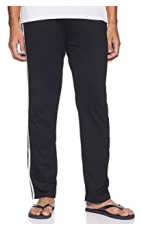

Predicted Label is: [0] 

Input Image is: img35.jpeg


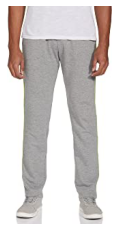

Predicted Label is: [1] 

Input Image is: img36.jpeg


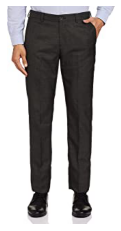

Predicted Label is: [2] 

Input Image is: img37.jpeg


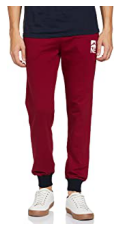

Predicted Label is: [2] 

Input Image is: img38.jpeg


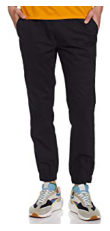

Predicted Label is: [0] 

Input Image is: img39.jpeg


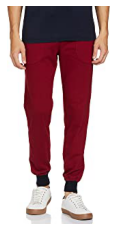

Predicted Label is: [2] 

Input Image is: img4.jpeg


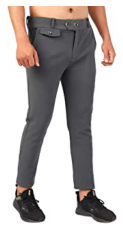

Predicted Label is: [2] 

Input Image is: img40.jpeg


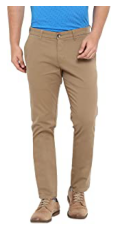

Predicted Label is: [2] 

Input Image is: img41.jpeg


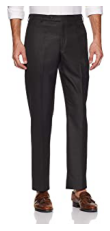

Predicted Label is: [2] 

Input Image is: img42.jpeg


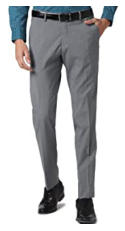

Predicted Label is: [0] 

Input Image is: img43.jpeg


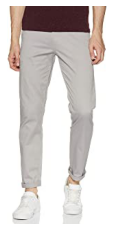

Predicted Label is: [0] 

Input Image is: img44.jpeg


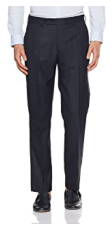

Predicted Label is: [2] 

Input Image is: img45.jpeg


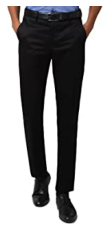

Predicted Label is: [0] 

Input Image is: img46.jpeg


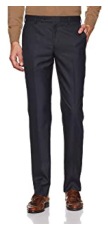

Predicted Label is: [2] 

Input Image is: img47.jpeg


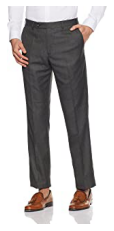

Predicted Label is: [2] 

Input Image is: img48.jpeg


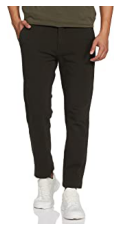

Predicted Label is: [0] 

Input Image is: img49.jpeg


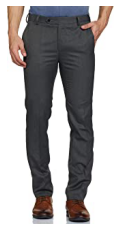

Predicted Label is: [2] 

Input Image is: img5.jpeg


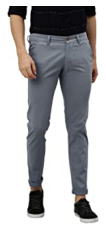

Predicted Label is: [2] 

Input Image is: img50.jpeg


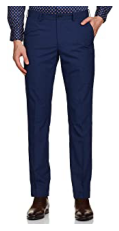

Predicted Label is: [2] 

Input Image is: img51.jpeg


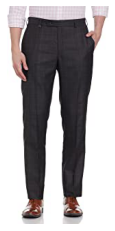

Predicted Label is: [2] 

Input Image is: img52.jpeg


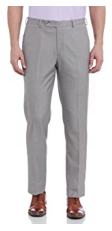

Predicted Label is: [0] 

Input Image is: img53.jpeg


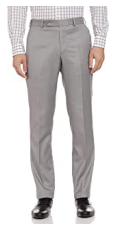

Predicted Label is: [0] 

Input Image is: img54.jpeg


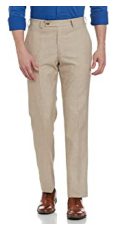

Predicted Label is: [0] 

Input Image is: img55.jpeg


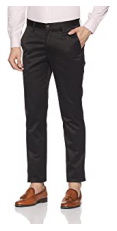

Predicted Label is: [0] 

Input Image is: img56.jpeg


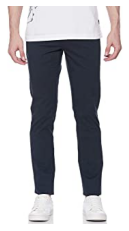

Predicted Label is: [0] 

Input Image is: img57.jpeg


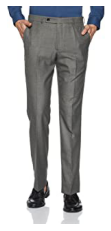

Predicted Label is: [2] 

Input Image is: img58.jpeg


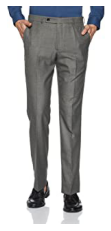

Predicted Label is: [2] 

Input Image is: img59.jpeg


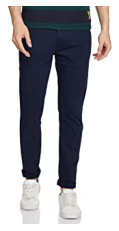

Predicted Label is: [0] 

Input Image is: img6.jpeg


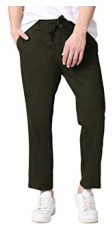

Predicted Label is: [0] 

Input Image is: img60.jpeg


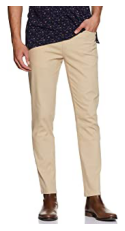

Predicted Label is: [0] 

Input Image is: img61.jpeg


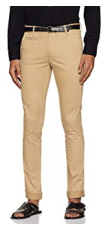

Predicted Label is: [2] 

Input Image is: img62.jpeg


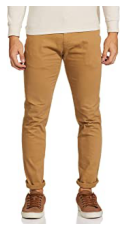

Predicted Label is: [2] 

Input Image is: img63.jpeg


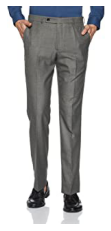

Predicted Label is: [2] 

Input Image is: img64.jpeg


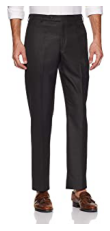

Predicted Label is: [2] 

Input Image is: img65.jpeg


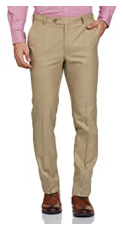

Predicted Label is: [2] 

Input Image is: img66.jpeg


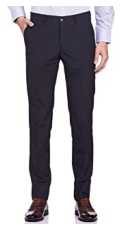

Predicted Label is: [2] 

Input Image is: img67.jpeg


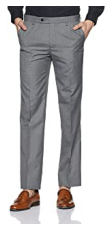

Predicted Label is: [2] 

Input Image is: img68.jpeg


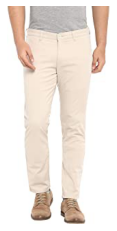

Predicted Label is: [1] 

Input Image is: img69.jpeg


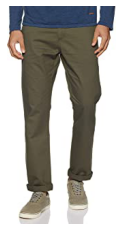

Predicted Label is: [2] 

Input Image is: img7.jpeg


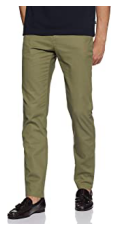

Predicted Label is: [2] 

Input Image is: img70.jpeg


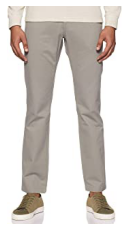

Predicted Label is: [1] 

Input Image is: img71.jpeg


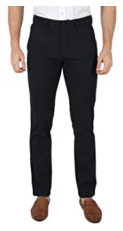

Predicted Label is: [2] 

Input Image is: img72.jpeg


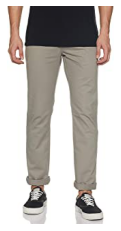

Predicted Label is: [0] 

Input Image is: img8.jpeg


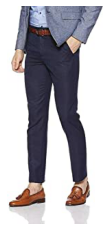

Predicted Label is: [0] 

Input Image is: img9.jpeg


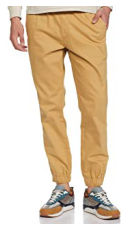

Predicted Label is: [2] 



In [119]:
for test_dir in test_dire:
    for i in listdir(test_dir):
        print("Input Image is:",i)
        img= image.load_img('{}/{}'.format(test_dir,i))                         
        test_image = image.load_img('{}/{}'.format(test_dir,i),target_size=(128, 128))
        test_image = image.img_to_array(test_image)
        plt.imshow(img)
        plt.axis('off')
        plt.show()
        test_image = np.expand_dims(test_image, axis=0)
        result = saved_model.predict(test_image)
        print("Predicted Label is:",np.argmax(result, axis=1),"\n")